In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import cufflinks as cf
%matplotlib inline
import plotly.plotly as py
import plotly.graph_objs as go
from plotly import figure_factory as FF

from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
sns.set_style('whitegrid')


In [2]:
init_notebook_mode(connected=True)
cf.go_offline()

In [3]:
stock_data = pd.read_csv('all_stocks_2006-01-01_to_2018-01-01.csv')
stock_data['Date']=pd.to_datetime(stock_data['Date'])


In [4]:
stock_data.head()

,Date,Open,High,Low,Close,Volume,Name
0,2006-01-03,77.76,79.35,77.24,79.11,3117200,MMM
1,2006-01-04,79.49,79.49,78.25,78.71,2558000,MMM
2,2006-01-05,78.41,78.65,77.56,77.99,2529500,MMM
3,2006-01-06,78.64,78.90,77.64,78.63,2479500,MMM
4,2006-01-09,78.50,79.83,78.46,79.02,1845600,MMM


In [5]:
stock_data.sort_values('Date',ascending=False).head(10)

,Date,Open,High,Low,Close,Volume,Name
93611,2017-12-29,69.79,70.13,69.43,69.85,6613070,AABA
42277,2017-12-29,154.17,154.72,153.42,153.42,3327087,IBM
33217,2017-12-29,17.27,17.53,17.27,17.45,76149513,GE
60394,2017-12-29,85.63,86.05,85.50,85.54,18717406,MSFT
3019,2017-12-29,236.48,237.31,235.37,235.37,1343878,MMM
75494,2017-12-29,128.32,128.49,127.57,127.57,1806925,UTX
18118,2017-12-29,125.36,125.98,125.19,125.19,3829007,CVX
54356,2017-12-29,172.98,172.98,171.92,172.12,2201771,MCD
39257,2017-12-29,190.74,190.74,189.53,189.53,4637827,HD
15098,2017-12-29,158.05,158.50,157.51,157.58,2616142,CAT


In [6]:
#checking for top 5 companies having highest stock value on 2017-12-29
stock_data[stock_data['Date']=='2017-12-29'].sort_values('High',ascending=False).head(5)

,Date,Open,High,Low,Close,Volume,Name
90592,2017-12-29,1182.35,1184.00,1167.50,1169.47,2688391,AMZN
87573,2017-12-29,1055.49,1058.05,1052.70,1053.40,1180340,GOOGL
12078,2017-12-29,296.94,297.30,294.83,294.91,1824591,BA
36237,2017-12-29,255.87,256.65,252.91,254.76,2519253,GS
3019,2017-12-29,236.48,237.31,235.37,235.37,1343878,MMM


(732312.0, 736695.0)

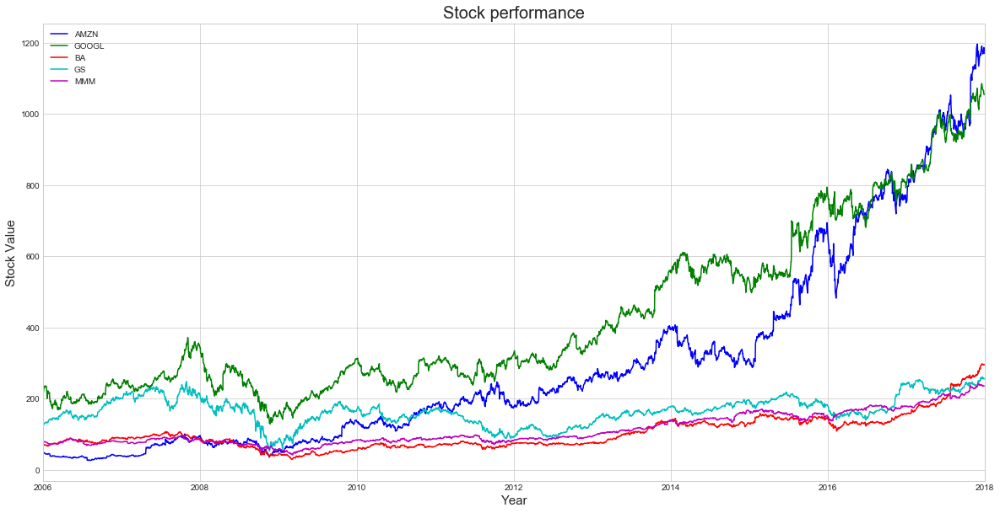

In [7]:
#plotting stock close values vs date
plt.figure(figsize=(20,10))
plt.plot(stock_data[stock_data['Name']=='AMZN']['Date'],stock_data[stock_data['Name']=='AMZN']['Close'],'b',label='AMZN')
plt.plot(stock_data[stock_data['Name']=='GOOGL']['Date'],stock_data[stock_data['Name']=='GOOGL']['Close'],'g',label='GOOGL')
plt.plot(stock_data[stock_data['Name']=='BA']['Date'],stock_data[stock_data['Name']=='BA']['Close'],'r',label='BA')
plt.plot(stock_data[stock_data['Name']=='GS']['Date'],stock_data[stock_data['Name']=='GS']['Close'],'c',label='GS')
plt.plot(stock_data[stock_data['Name']=='MMM']['Date'],stock_data[stock_data['Name']=='MMM']['Close'],'m',label='MMM')
plt.legend()
plt.xlabel('Year',fontsize=15)
plt.ylabel('Stock Value',fontsize=15)
plt.title('Stock performance',fontsize=20)
plt.xlim('2006','2018')

Amazon  and Google has highest growth rate compare to other three

In [8]:
test=stock_data.pivot(index='Date', columns='Name', values='Close')[['AMZN','GOOGL','BA','GS','MMM']]
#test.iplot(theme='white', filename='Tutorial White', world_readable=True)
test.iplot(theme='white',yTitle='Stock Value',xTitle='Year')

In [9]:
volume=stock_data.pivot(index='Date', columns='Name', values='Volume')[['AMZN','GOOGL','BA','GS','MMM']]
#test.iplot(theme='white', filename='Tutorial White', world_readable=True)
volume.iplot(theme='white',xTitle='Year',yTitle='Volume')

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=20,center=False).mean()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:10: FutureWarning:

pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=50,center=False).mean()



(732312.0, 736695.0)

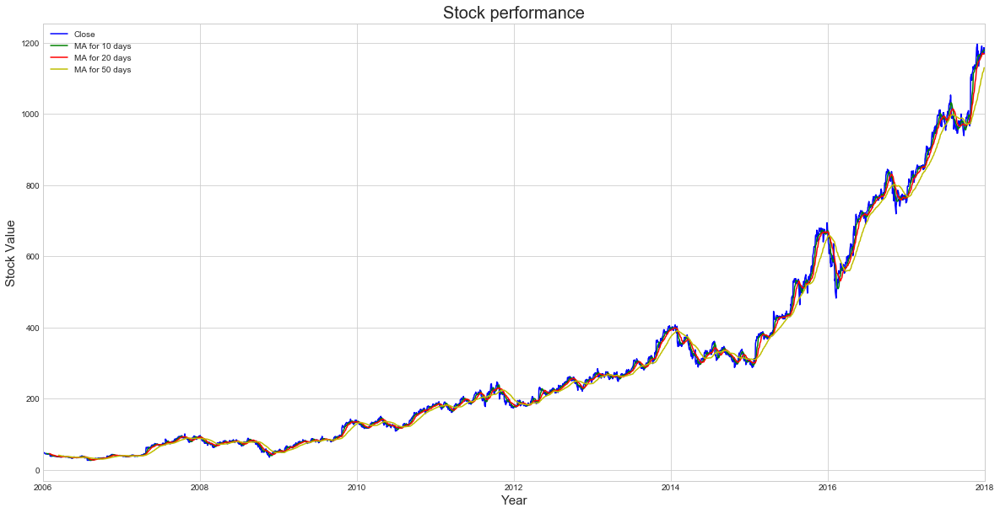

In [10]:
#comparing Rolling Mean of Amazon stock for 10,20 and 50days

AMZN=pd.read_csv('AMZN_2006-01-01_to_2018-01-01.csv')
AMZN['Date']=pd.to_datetime(AMZN['Date'])

ma_day = [10,20,50]

for ma in ma_day:
    column_name = "MA for %s days" %(str(ma))
    AMZN[column_name]=pd.rolling_mean(AMZN['Close'],ma)
    

plt.figure(figsize=(20,10))
plt.plot(AMZN['Date'],AMZN['Close'],'b',label='Close')
plt.plot(AMZN['Date'],AMZN['MA for 10 days'],'g',label='MA for 10 days')
plt.plot(AMZN['Date'],AMZN['MA for 20 days'],'r',label='MA for 20 days')
plt.plot(AMZN['Date'],AMZN['MA for 50 days'],'y',label='MA for 50 days')
plt.legend()
plt.xlabel('Year',fontsize=15)
plt.ylabel('Stock Value',fontsize=15)
plt.title('Stock performance',fontsize=20)
plt.xlim('2006','2018')




(732312.0, 736695.0)

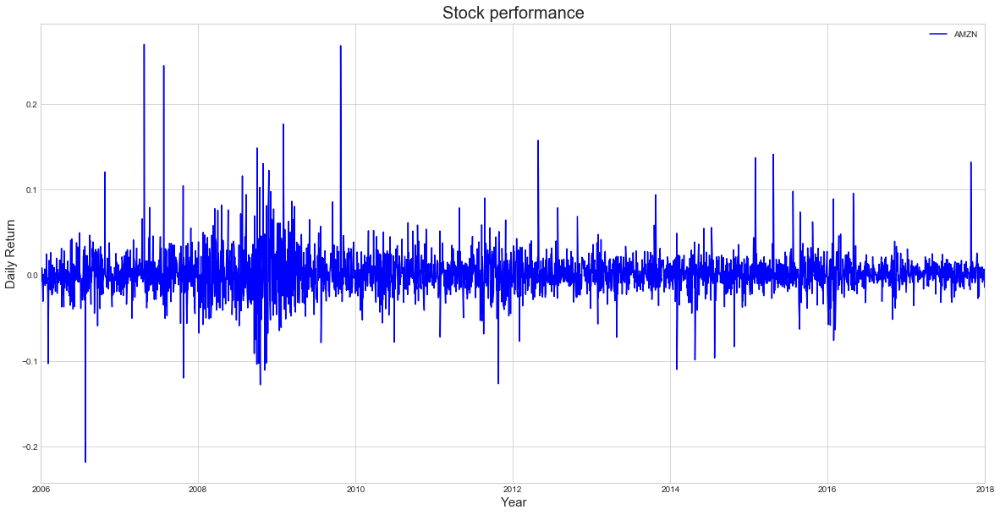

In [11]:
AMZN['Daily Return'] = AMZN['Close'].pct_change()
plt.figure(figsize=(20,10))
plt.plot(AMZN['Date'],AMZN['Daily Return'],'b',label='AMZN')
plt.legend()
plt.xlabel('Year',fontsize=15)
plt.ylabel('Daily Return',fontsize=15)
plt.title('Stock performance',fontsize=20)
plt.xlim('2006','2018')

In [12]:
#plotting candlestick plot for amazon stock for year 2017
AMZN=pd.read_csv('AMZN_2006-01-01_to_2018-01-01.csv')
AMZN['Date']=pd.to_datetime(AMZN['Date'])
AMZN=AMZN[AMZN['Date']>'2016-12-31']

trace=go.Candlestick(x=AMZN.Date,
                       open=AMZN.Open,
                       high=AMZN.High,
                       low=AMZN.Low,
                       close=AMZN.Close)
layout = {
    'title': 'Amazon',
    'yaxis': {'title': 'Amazon Stock'}
      
}

data = [trace]
fig = go.Figure(data=data,layout=layout)
iplot(fig)

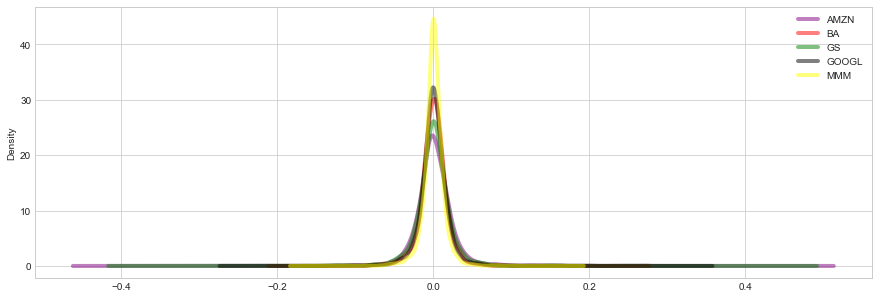

In [13]:
#lets compare the daily return of top 5 companies
AMZN=pd.read_csv('AMZN_2006-01-01_to_2018-01-01.csv')
MMM=pd.read_csv('MMM_2006-01-01_to_2018-01-01.csv')
BA=pd.read_csv('BA_2006-01-01_to_2018-01-01.csv')
GS=pd.read_csv('GS_2006-01-01_to_2018-01-01.csv')
GOOGL=pd.read_csv('GOOGL_2006-01-01_to_2018-01-01.csv')

AMZN['Daily Return'] = AMZN['Close'].pct_change()
MMM['Daily Return'] = MMM['Close'].pct_change()
BA['Daily Return'] = BA['Close'].pct_change()
GS['Daily Return'] = GS['Close'].pct_change()
GOOGL['Daily Return'] = GOOGL['Close'].pct_change()

plt.figure(figsize=(15,5))
AMZN['Daily Return'].plot.kde(label='AMZN',color='purple',alpha=0.5,linewidth =4)
BA['Daily Return'].plot.kde(label='BA',color='red',alpha=0.5,linewidth =4)
GS['Daily Return'].plot.kde(label='GS',color='green',alpha=0.5,linewidth =4)
GOOGL['Daily Return'].plot.kde(label='GOOGL',color='black',alpha=0.5,linewidth =4)
MMM['Daily Return'].plot.kde(label='MMM',color='yellow',alpha=0.5,linewidth =4)
plt.legend()

# It can be seen that 3M stocks are less volatile



In [14]:
test=stock_data.pivot(index='Date', columns='Name', values='Close')[stock_data['Name'].unique()]
tech_rets = test.pct_change()

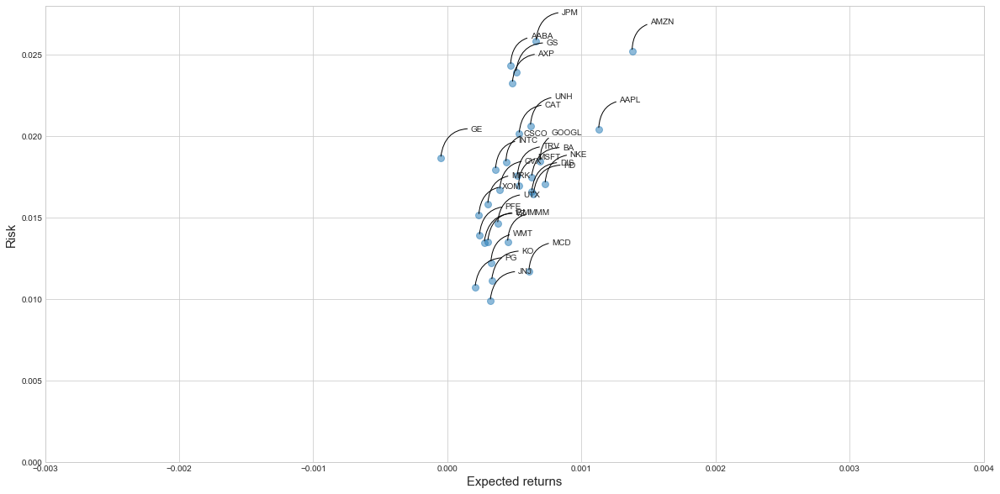

In [15]:
plt.figure(figsize=(20,10))
rets = tech_rets.dropna()

# Scatter plot of expected return of the stocks vs. their standard deviations of daily retunrs
area = np.pi*20

plt.scatter(rets.mean(), rets.std(),alpha = 0.5,s =area)

plt.ylim([0.00,0.028])
plt.xlim([-0.003,0.004])

plt.xlabel('Expected returns',fontsize=15)
plt.ylabel('Risk',fontsize=15)

for label, x, y in zip(rets.columns, rets.mean(), rets.std()):
    plt.annotate(
        label, 
        xy = (x, y), xytext = (50, 30),
        textcoords = 'offset points', ha = 'right', va = 'bottom',
        arrowprops = dict(arrowstyle = '-', connectionstyle = 'arc3,rad=0.5'))

# Amazon has highest return value and Risk comapare other companies. this means higher you take risk , higher return you get. 

In [16]:
AMZN=pd.read_csv('AMZN_2006-01-01_to_2018-01-01.csv')
MMM=pd.read_csv('MMM_2006-01-01_to_2018-01-01.csv')
BA=pd.read_csv('BA_2006-01-01_to_2018-01-01.csv')
GS=pd.read_csv('GS_2006-01-01_to_2018-01-01.csv')
GOOGL=pd.read_csv('GOOGL_2006-01-01_to_2018-01-01.csv')


AMZN['Date']=pd.to_datetime(AMZN['Date'])
MMM['Date']=pd.to_datetime(MMM['Date'])
BA['Date']=pd.to_datetime(BA['Date'])
GS['Date']=pd.to_datetime(GS['Date'])
GOOGL['Date']=pd.to_datetime(GOOGL['Date'])




Text(0.5,1,'Volume,Close vs Date(GOOGL)')

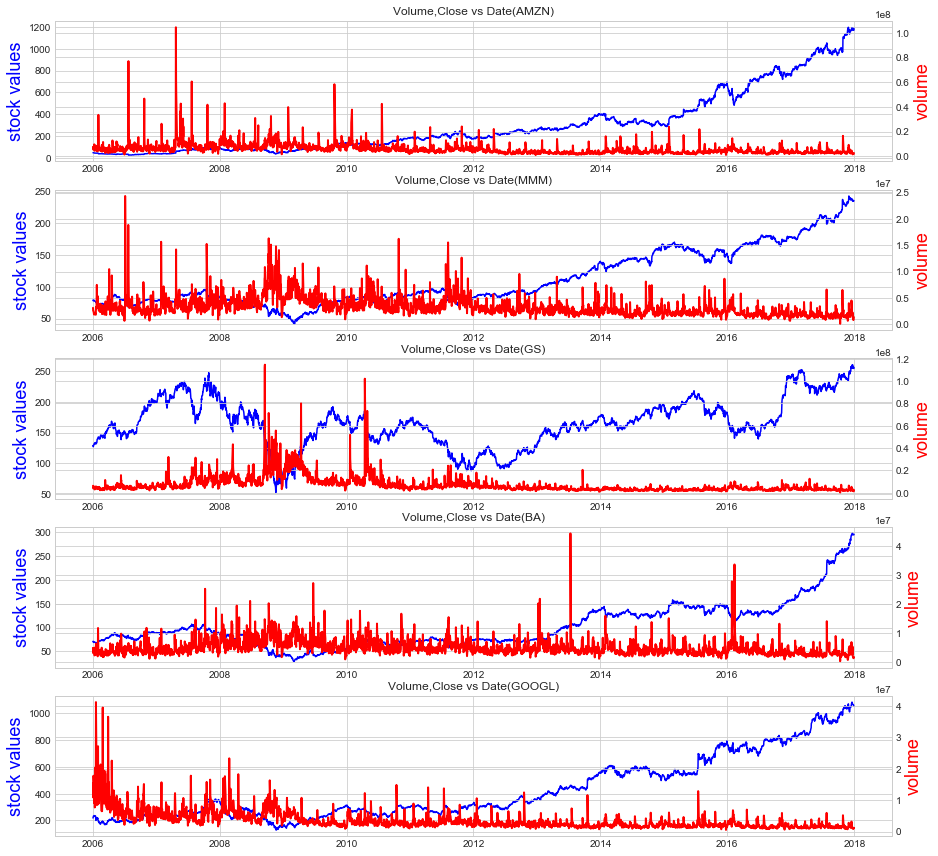

In [17]:
#plotting stocke close values and volume vs date for tope 5 companies.
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(15,15))
axes[0].plot('Date','Close',data=AMZN,color='blue')
axes[0].set_ylabel(r"stock values", fontsize=18, color="blue")
ax0 = axes[0].twinx()
ax0.plot('Date','Volume',data=AMZN, lw=2, color="red")
ax0.set_ylabel(r"volume", fontsize=18, color="red")
axes[0].set_title('Volume,Close vs Date(AMZN)')

axes[1].plot('Date','Close',data=MMM,color='blue')
axes[1].set_ylabel(r"stock values", fontsize=18, color="blue")
ax1 = axes[1].twinx()
ax1.plot('Date','Volume',data=MMM, lw=2, color="red")
ax1.set_ylabel(r"volume", fontsize=18, color="red")
axes[1].set_title('Volume,Close vs Date(MMM)')

axes[2].plot('Date','Close',data=GS,color='blue')
axes[2].set_ylabel(r"stock values", fontsize=18, color="blue")
ax2 = axes[2].twinx()
ax2.plot('Date','Volume',data=GS, lw=2, color="red")
ax2.set_ylabel(r"volume", fontsize=18, color="red")
axes[2].set_title('Volume,Close vs Date(GS)')

axes[3].plot('Date','Close',data=BA,color='blue')
axes[3].set_ylabel(r"stock values", fontsize=18, color="blue")
ax3 = axes[3].twinx()
ax3.plot('Date','Volume',data=BA, lw=2, color="red")
ax3.set_ylabel(r"volume", fontsize=18, color="red")
axes[3].set_title('Volume,Close vs Date(BA)')

axes[4].plot('Date','Close',data=GOOGL,color='blue')
axes[4].set_ylabel(r"stock values", fontsize=18, color="blue")
ax4 = axes[4].twinx()
ax4.plot('Date','Volume',data=GOOGL, lw=2, color="red")
ax4.set_ylabel(r"volume", fontsize=18, color="red")
axes[4].set_title('Volume,Close vs Date(GOOGL)')



it seems that as the stock value decreases , volume of stock traded increase and vice versa.

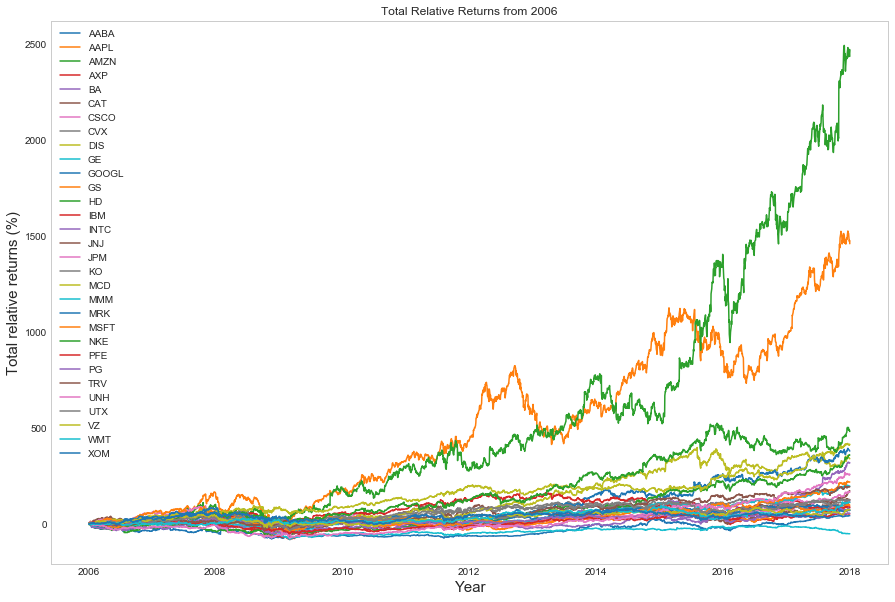

In [18]:
test2=stock_data.pivot(index='Date', columns='Name', values='Close')

log_returns = np.log(test2).diff()


fig, ax = plt.subplots(figsize=(15,10))

for c in log_returns:
    ax.plot(log_returns.index, 100*(np.exp(log_returns[c].cumsum()) - 1), label=str(c))

ax.set_ylabel('Total relative returns (%)',fontsize=15)
ax.set_xlabel('Year',fontsize=15)
ax.set_title('Total Relative Returns from 2006')
ax.legend(loc='upper left')
ax.grid()



Amazon has highest total relative revenue followed by AAPL

In [19]:
log_returns=log_returns.cumsum()
log_returns.iplot(theme='white',yTitle='Cumulative log returns',xTitle='Year',title='Cumulative log returns from 2006' )


AAPL and Amazon have highest cumulative return  from 2008 to 2010

In [20]:
#adding new column in data industry and adding instry according to company

Health_care=['MMM','JNJ','MRK','PFE','UNH']
Finance=['AXP','GS','JPM','TRV']
Technology=[ 'AAPL','CSCO','IBM','INTC','MSFT','GOOGL','AABA']
Capital_Goods=[ 'BA','CAT','UTX']
Energy=['CVX','XOM','GE']
Consumer_NonDurables=[ 'KO','NKE']
Consumer_Services=[ 'DIS','HD','MCD','WMT','AMZN']
Basic_Industries=['PG']
Public_Utilities=['VZ']

#function to return indusrty by company name

def industry(x):
    if x in Health_care:
        return 'Health_care'
    elif x in Finance:
        return 'Finance'
    elif x in Technology:
        return 'Technology'
    elif x in Capital_Goods:
        return 'Capital_Goods'
    elif x in Energy:
        return 'Energy'
    elif x in Consumer_NonDurables:
        return 'Consumer_NonDurables'
    elif x in Consumer_Services:
        return 'Consumer_Services'
    elif x in Basic_Industries:
        return 'Basic_Industries'
    else:
        return 'Public_Utilities'



stock_data['Industry']=stock_data['Name'].apply(industry)




In [21]:
stock_data['Year']=stock_data['Date'].apply(lambda x: x.year)

In [22]:
gpByIndustry=stock_data.groupby(['Industry','Year'],as_index=False).mean()

In [23]:

trace_Health_care = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Health_care']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Health_care']['Open'],
    name='Health care'
)

trace_Finance = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Finance']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Finance']['Open'],
    name='Finance'
)

trace_Technology = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Technology']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Technology']['Open'],
    name='Technology'
)

trace_Capital_Goods = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Capital_Goods']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Capital_Goods']['Open'],
    name='Capital Goods'
)

trace_Energy = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Energy']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Energy']['Open'],
    name='Energy'
)

trace_Consumer_NonDurables = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Consumer_NonDurables']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Consumer_NonDurables']['Open'],
    name='Consumer Non Durables'
)

trace_Consumer_Services = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Consumer_Services']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Consumer_Services']['Open'],
    name='Consumer Services'
)

trace_Basic_Industries = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Basic_Industries']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Basic_Industries']['Open'],
    name='Basic Industries'
)

trace_Public_Utilities = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Public_Utilities']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Public_Utilities']['Open'],
    name='Public Utilities'
)

data = [trace_Health_care,trace_Finance,trace_Technology,trace_Capital_Goods,trace_Energy,
        trace_Consumer_NonDurables,trace_Consumer_Services,trace_Basic_Industries,trace_Public_Utilities]

layout= go.Layout(
    title='Average Stock price vs year',
    hovermode='closest',
    xaxis=dict(
        title='Year',
        ticklen=5,
        zeroline=False,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Stockprice',
        ticklen=5,
        gridwidth=2,
    ),
)
fig = go.Figure(data=data, layout=layout)
iplot(fig)




# Stock prices of consumer services and Technology sector is increasing compare to other sectors

In [24]:


trace_Health_care = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Health_care']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Health_care']['Volume'],
    name='Health care'
)

trace_Finance = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Finance']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Finance']['Volume'],
    name='Finance'
)

trace_Technology = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Technology']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Technology']['Volume'],
    name='Technology'
)

trace_Capital_Goods = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Capital_Goods']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Capital_Goods']['Volume'],
    name='Capital Goods'
)

trace_Energy = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Energy']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Energy']['Volume'],
    name='Energy'
)

trace_Consumer_NonDurables = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Consumer_NonDurables']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Consumer_NonDurables']['Volume'],
    name='Consumer Non Durables'
)

trace_Consumer_Services = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Consumer_Services']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Consumer_Services']['Volume'],
    name='Consumer Services'
)

trace_Basic_Industries = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Basic_Industries']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Basic_Industries']['Volume'],
    name='Basic Industries'
)

trace_Public_Utilities = go.Scatter(
    x=gpByIndustry[gpByIndustry['Industry']=='Public_Utilities']['Year'],
    y=gpByIndustry[gpByIndustry['Industry']=='Public_Utilities']['Volume'],
    name='Public Utilities'
)

data = [trace_Health_care,trace_Finance,trace_Technology,trace_Capital_Goods,trace_Energy,
        trace_Consumer_NonDurables,trace_Consumer_Services,trace_Basic_Industries,trace_Public_Utilities]

layout= go.Layout(
    title='Average Stock Volume vs year',
    hovermode='closest',
    xaxis=dict(
        title='Year',
        ticklen=5,
        zeroline=False,
        gridwidth=2,
    ),
    yaxis=dict(
        title='Average Volume',
        ticklen=5,
        gridwidth=2,
    ),
)


fig = go.Figure(data=data, layout=layout)
iplot(fig)


# Stcok vloume of Techology sector has been reduced significantly compare to other sectors




In [25]:
# function to calcularte RSI

def RSI(df, column="Close", period=14):
    # wilder's RSI
 
    delta = df[column].diff()
    up, down = delta.copy(), delta.copy()

    up[up < 0] = 0
    down[down > 0] = 0

    rUp = up.ewm(com=period - 1,  adjust=False).mean()
    rDown = down.ewm(com=period - 1, adjust=False).mean().abs()

    rsi = 100 - 100 / (1 + rUp / rDown)    

    return df.join(rsi.to_frame('RSI'))

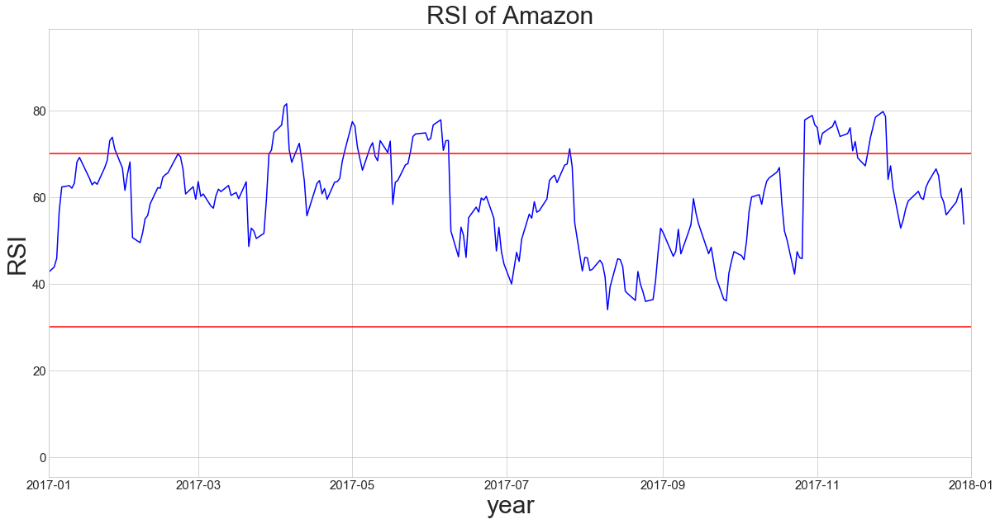

In [26]:
RSIdf=RSI(AMZN)
plt.figure(figsize=(20,10))
plt.plot(RSIdf['Date'], RSIdf['RSI'], 'b') # 'r' is the color red
plt.xlabel('year',fontsize=30)
plt.ylabel('RSI',fontsize=30)
plt.title('RSI of Amazon',fontsize=30)
plt.xlim('2017','2018')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.axhline(30,color='r')
plt.axhline(70,color='r')